# **8. Persamaan Panas, Gelombang, dan Laplace**

> Gabriel Jonathan (gabejonathan29@gmail.com)

Pada Praktikum 8, kita akan berfokus pada pencarian solusi dan visualisasi dari tiga masalah utama dalam PDP : Persamaan Panas, Persamaan Gelombang, dan Persamaan Laplace. 

**Anda diasumsikan sudah familiar dengan konsep separasi variabel untuk mencari solusi suatu PDP**. Modul ini tidak akan membahas mengenai metode separasi variabel, tetapi lebih berfokus pada pemanfaatan Python untuk membantu Anda melakukan perhitungan dalam penentuan solusi PDP serta visualisasi solusinya.

## **8.1 Persamaan Panas**

Misalkan diberikan persamaan panas untuk masalah konduksi panas pada suatu batang yang dapat dituliskan sebagai
$$
\alpha^2 u_{xx}=u_t, \hspace{1cm} 0<x<L, \hspace{0.5cm} t>0,
$$
dengan syarat batas homogen
$$
u(0,t) = 0, \hspace{0.5cm}u(L,t) = 0, \hspace{0.5cm} t>0
$$

dan syarat awal

$$
u(x,0) = f(x), \hspace{1cm} 0\leq x\leq L
$$

Melalui separasi variabel, solusi dari MNA tersebut dapat dituliskan sebagai
$$
u(x,t) = \sum_{n=1}^\infty c_n e^{-n^2\pi^2\alpha^2t/L^2}\sin\left(\dfrac{n\pi x}{L}\right)
$$

dimana $c_n$ adalah koefisien dari deret Fourier Sinus $f(x)$
$$
f(x) = \sum_{n=1}^\infty c_n\sin\left(\dfrac{n\pi x}{L}\right)
$$
Dalam kata lain, kita punya hubungan 
$$
c_n = \dfrac{2}{L}\int_0^L f(x)\sin\left(\dfrac{n\pi x}{L}\right)\;dx
$$

> **Remark Penting**\
Perhatikan bahwa untuk sebarang kondisi awal, nilai eksponen negatif $e^{-n^2\pi^2\alpha^2t/L^2}$ pada solusi $u(x,t)$ pasti menjamin kondisi
$$
\lim_{t\to \infty}u(x,t) = 0
$$

> Bagaimana kalau diberikan masalah nilai awal yang sama, untuk **syarat batas nonhomogen ?**

Pandang masalah nilai awal berikut,
\begin{align*}
&\alpha^2 u_{xx}=u_t, \hspace{1cm}0<x<L, \hspace{0.5cm} t>0,\tag{2}\\
&u(0, t) = T_1, \hspace{0.5cm}u(L,t) = T_2, \hspace{0.5cm}t>0\\
&u(x,0) = f(x), \hspace{1cm} 0\leq x\leq L
\end{align*}
Kita dapat lakukan transformasi MNA (2) menjadi suatu MNA dengan syarat batas homogen. 

Jika konduksi panas terus dilakukan untuk waktu yang sangat lama ($t\to \infty$), akan dijumpai kondisi tunak (*steady state*). Artinya, distribusi panas tidak akan berubah lagi seiiring bertambahnya waktu. Misalkan $v(x)$ adalah distribusi temperatur *steady-state* (dalam kata lain, $\lim_{t\to \infty}u(x,t)=v(x)$)

 Haruslah $v(x)$ memenuhi masalah nilai awal (2). Kita punya
\begin{align*}
v''(x) = v_t = 0
\end{align*}
sehingga $v(x)$ adalah fungsi linear dari $x$ saja. Karena $v(x)$ memenuhi kondisi batas $v(0)=T_1, v(L)=T_2$, didapatkan
$$
v(x) = (T_2- T_1) \dfrac{x}{L} + T_1
$$

Misalkan solusi $u(x,t)$ dari MNA dapat dituliskan sebagai
$$
u(x,t) = v(x) + w(x,t)
$$
dimana $w(x,t)$ adalah solusi transien. Karena $u(x,t)$ memenuhi (2), didapatkan
\begin{align*}
\alpha^2 (v+w)_{xx} &= (v+w)_t \implies \alpha^2 w_{xx}=w_t\\
w(0,t) &= 0\\
w(L,t) &= 0\\
w(x,0) &= f(x)-v(x)
\end{align*}
MNA diatas merupakan persamaan panas dengan syarat batas homogen. Solusi $u(x,t)$ ialah
$$
u(x,t) = (T_2-T_1)\dfrac{x}{L}+T_1 + \sum_{n=1}^\infty c_n e^{-n^2\pi^2\alpha^2t/L^2}\sin\left(\dfrac{n\pi x}{L}\right)
$$
dengan
$$
c_n = \dfrac{2}{L}\int_0^L [f(x)-v(x)]\sin\left(\dfrac{n\pi x}{L}\right)\;dx
$$


> **Contoh 1 : Persamaan Panas**

Pandang masalah konduksi panas 
\begin{align*}
u_{xx} &= u_t, \hspace{0.5cm}0<x<30, \hspace{0.5cm}t>0,\\
u(0,t) &= 20, \hspace{0.5cm} u(30,t) = 50, \hspace{0.5cm}t>0,\\
u(x,0) &= 60-2x, \hspace{0.5cm}0<x<30
\end{align*}

Solusi *steady state* dari sistem tersebut adalah $v(x)=20+x$, dengan solusi transien $w(x,t)$ memenuhi 
\begin{align*}
w_{xx} &= w_t, \hspace{0.5cm}0<x<30, \hspace{0.5cm}t>0,\\
w(0,t) &= 0, \hspace{0.5cm} w(30,t) = 0, \hspace{0.5cm}t>0,\\
w(x,0) &= 60-2x - v(x) = 40-3x, \hspace{0.5cm}0<x<30
\end{align*}

Diperoleh solusi
$$
u(x,t) = 20+x + \sum_{n=1}^\infty c_n e^{-n^2\pi^2t/900}\sin\left(\dfrac{n\pi x}{30}\right)
$$

dengan $c_n$ merupakan koefisien deret Fourier Sinus fungsi $f(x)-v(x)=40-3x$.

Berikut adalah demonstrasi pemanfaatan Python dalam penentuan solusi PDP. 

In [ ]:
from sympy import *
from sympy.abc import x
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['figure.dpi'] = 120

# Hitung dulu koesifien c_n. Anda dapat hitung secara manual, ataupun memanfaatkan SymPy
fseries_fv = fourier_series((40-3*x)*(Heaviside(x)-Heaviside(x-30)) - (40+3*x)*(Heaviside(x+30)-Heaviside(x)), (x, -30, 30))
fseries_fv.truncate(20)
# Perhatikan bahwa c_n = (100(-1)^n + 80)/(pi.n)


-20*sin(pi*x/30)/pi + 90*sin(pi*x/15)/pi - 20*sin(pi*x/10)/(3*pi) + 45*sin(2*pi*x/15)/pi - 4*sin(pi*x/6)/pi + 30*sin(pi*x/5)/pi - 20*sin(7*pi*x/30)/(7*pi) + 45*sin(4*pi*x/15)/(2*pi) - 20*sin(3*pi*x/10)/(9*pi) + 18*sin(pi*x/3)/pi - 20*sin(11*pi*x/30)/(11*pi) + 15*sin(2*pi*x/5)/pi - 20*sin(13*pi*x/30)/(13*pi) + 90*sin(7*pi*x/15)/(7*pi) - 4*sin(pi*x/2)/(3*pi) + 45*sin(8*pi*x/15)/(4*pi) - 20*sin(17*pi*x/30)/(17*pi) + 10*sin(3*pi*x/5)/pi - 20*sin(19*pi*x/30)/(19*pi) + 9*sin(2*pi*x/3)/pi

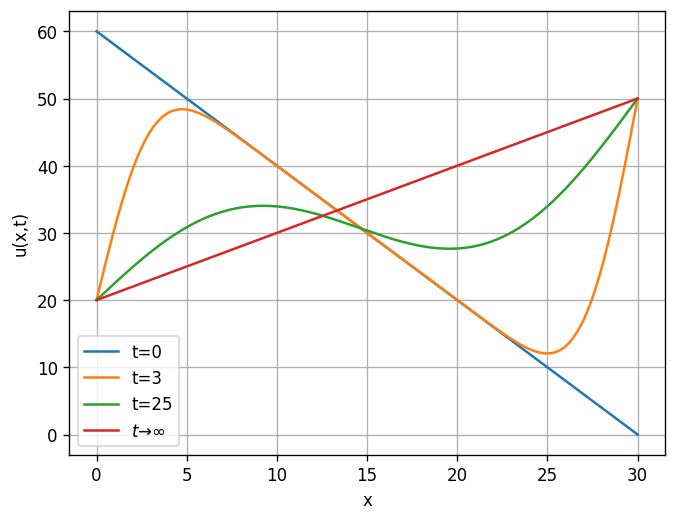

In [ ]:
# Ambil 500 suku pertama untuk visualisasi.
c_ns = np.array([(100*(-1)**n + 80)/(np.pi*n) for n in range(1, 501)])

def u(x,t):
    # Jika t>0, lakukan perhitungan untuk u(x,t)
    if t>0:
        sum_cn = np.array([c_ns[n-1] * np.exp(-(n*np.pi)**2*t/900) * np.sin(n*np.pi*x/30) for n in range(1, 501)])
        return 20 + x + np.sum(sum_cn, axis=0) # Jumlahkan c_n
    # Apabila t=0, berikan output berupa kondisi awal 
    if t==0:
        return 60 - 2*x

xs = np.linspace(0, 30, 1000)
plt.plot(xs, u(xs, 0))
plt.plot(xs, u(xs, 3))
plt.plot(xs, u(xs, 25))
plt.plot(xs, u(xs, 1000)) # untuk t->oo, pilih t cukup besar saja
plt.xlabel('x')
plt.ylabel('u(x,t)')
plt.legend(['t=0', 't=3', 't=25', r'$t\to\infty$'])
plt.grid('on')
plt.show()


Solusi $u(x,t)$ dapat juga digambarkan pada bidang 3-dimensi dengan menggunakan perintah `plot_surface` dari `matplotlib`. Pertama, tentukan dahulu solusi $u(x,t)$ pada domain $[0, L]\times [0, T]$. 


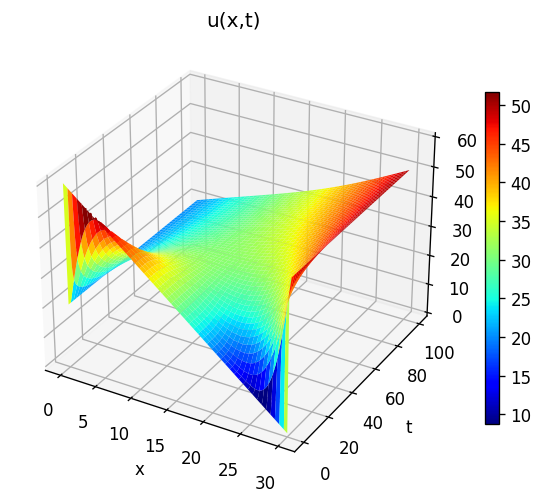

In [ ]:
from matplotlib import cm # colormap, untuk memilih warna dari plot permukaan
n_t = 250
n_x = 200
T = 100 # waktu akhir
ts  = np.linspace(0, T, n_t)
xs = np.linspace(0, 30, n_x)
u_xt = np.zeros((n_t, n_x)) # siapkan array kosong untuk memuat solusi 
for i in range(len(ts)):
    u_xt[i, :] = u(xs, ts[i])

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
xs_m, ts_m = np.meshgrid(xs, ts)
surface_u = ax.plot_surface(xs_m, ts_m, u_xt, cmap=cm.jet)
fig.colorbar(surface_u, aspect=25, shrink=0.75)
plt.xlabel('x')
plt.ylabel('t')
plt.title('u(x,t)')
plt.show()

Selain itu, alternatif lain untuk visualisasi solusi $u(x,t)$ adalah melalui animasi dengan menggunakan fungsi `FuncAnimation` dari `matplotlib.animation`.

(Tidak akan dibahas secara detail, karena sudah dipelajari pada praktikum MA2151 Simulasi dan Komputasi Matematika)

In [ ]:
%matplotlib inline
from matplotlib import rc
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
rc('animation', html='jshtml')


fig, ax = plt.subplots(1, 1)
line, = ax.plot(xs, u_xt[0, :])		 
text_time = ax.text(5, 60, "t = 0 s") # Text untuk penanda waktu.
ax.grid('on')
ax.set_xlabel('x')
ax.set_ylabel('u(x,t)')
plt.close()
def animate(i):
	line.set_data(xs[:], u_xt[i, :])
	text_time.set_text("t = " + str(i*T/n_t) + " s")
	return line


ani = FuncAnimation(fig, animate, frames=range(0, n_t , 1), interval=50, blit=False)
ani


## **8.2 Persamaan Gelombang**

Persamaan kedua yang akan dibahas adalah persamaan gelombang pada tali . Misalkan diberikan kasus untuk tali dengan ujung terikat dan kecepatan awal nol, yang dapat dituliskan sebagai
\begin{align*}
\alpha^2 u_{xx}&=u_{tt}, 0<x<L\\
u(0,t)&=0, \hspace{0.5cm} u(L,t)=0, \hspace{0.5cm}t\geq 0\\
u(x,0)&=f(x), \hspace{0.5cm} u_t(x,0)=0, \hspace{0.5cm}0\leq x\leq L\\
\end{align*}
dengan $f(0)=f(L)=0$. Disini, $f(x)$ menyatakan posisi awal tali pada saat $t=0$.

Melalui separasi variabel, solusi dari masalah nilai awal di atas dapat dituliskan sebagai
$$
u(x,t) = \sum_{n=1}^\infty c_n\sin\left(\dfrac{n\pi x}{L}\right)\cos\left(\dfrac{n\pi \alpha t}{L}\right)
$$

Dari kondisi awal $u(x,0)=f(x)$, maka didapatkan 

$$
u(x,0)=\sum_{n=1}^\infty c_n\sin\left(\dfrac{n\pi x}{L}\right) = f(x)
$$

sehingga $c_n$ adalah koefisien dari deret Fourier sinus untuk fungsi $f(x)$, atau $c_n = \dfrac{2}{L}\displaystyle\int_0^L f(x) \sin\left(\dfrac{n\pi x}{L}\right)\;dx$


> **Latihan 1**

Diberikan sebuah tali yang bergetar dengan panjang $L=30$ yang memenuhi persamaan gelombang 
$$
4u_{xx}=u_{tt}, \hspace{0.5cm}0<x<30, \hspace{0.5cm}t>0
$$

Asumsikan bahwa kedua ujung tali terikat dengan kecepatan awal 0. Tali bergerak dari posisi awal 
$$
u(x,0) = f(x) = 
\begin{cases} 
x/10, &0\leq x\leq 10\\
(30-x)/20, &10<x\leq 30
\end{cases}
$$

Tentukan solusi $u(x,t)$ dan plot solusi $u(x,t)$ terhadap $x$ untuk $t=0, 4, 7.5, 11$ dan $15$ s. 

## **8.3 Persamaan Laplace**

Persamaan Laplace dapat di interpretasikan sebagai suatu solusi tunak (*steady state*) dari persamaan panas atau gelombang. Karena persamaan ini bebas terhadap waktu (*time independent*), kita tidak memiliki suatu kondisi awal. Untuk itu, perlu didefinisikan suatu kondisi batas bagi persamaan Laplace. 

Persamaan Laplace homogen dua dimensi dapat dituliskan sebagai 
$$
u_{xx} + u_{yy}=0
$$

Dua kondisi batas yang umum/sering dibahas yaitu kondisi batas **Dirichlet** dan **Neumann** (sering disebut juga sebagai Masalah Dirichlet dan Masalah Neumann, berturut - turut). Pada masalah Dirichlet, kita perlu mencari solusi $u(x,t)$ dimana diberikan suatu nilai tetap pada batas domain. Sedangkan pada masalah Neumann, diberikan nilai turunan pada batasnya. Pada praktikum ini, kita hanya akan membahas masalah Dirichlet.

> Contoh Masalah Dirichlet 
Diberikan persamaan Laplace $u_{xx}+u_{yy}=0$ pada domain $0<x<a, 0<y<b$ dengan syarat batas
\begin{align*}
u(x,0)=0, \hspace{0.5cm} &u(x,b)=0, 0<x<a\\
u(0,y)=0, \hspace{0.5cm} &u(a,y)=f(y), 0\leq y \leq b\\
\end{align*}
dengan $f$ suatu fungsi terdefinisi di $0\leq y\leq b$.

Solusi dari MNA tersebut melalui metode separasi variabel adalah 
$$
u(x,y) = \sum_{n=1}^\infty c_n \sinh\left(\dfrac{n\pi x}{b}\right)\sin\left(\dfrac{n\pi y}{b}\right)
$$

dimana koefisien $c_n$ memenuhi hubungan
$$
u(a,y) = \sum_{n=1}^\infty c_n \sinh\left(\dfrac{n\pi a}{b}\right)\sin\left(\dfrac{n\pi y}{b}\right)
$$
sehingga $ c_n \sinh\left(\dfrac{n\pi a}{b}\right)$ tidak lain adalah koefisien dari deret Fourier Sinus fungsi $f(x)$ dengan periode $2b$, atau 
$$
 c_n \sinh\left(\dfrac{n\pi a}{b}\right) = \dfrac{2}{b}\int_0^b f(y)  \sinh\left(\dfrac{n\pi y}{b}\right)\;dy
$$




> *Catatan* : Tentunya $f$ tidak selalu harus terdefinisi untuk $x=a$ saja, bisa saja dituliskan kondisi batas berikut:
\begin{align*}
u(x,0)=g(x), \hspace{0.5cm} &u(x,b)=0, 0<x<a\\
u(0,y)=0, \hspace{0.5cm} &u(a,y)=0, 0\leq y \leq b\\
\end{align*}
Syarat batas diatas tetap merupakan kondisi batas Dirichlet.


> **Latihan 2**

Diberikan masalah Dirichlet untuk persamaan Laplace dengan domain $[0, 3]\times [0, 2]$ berikut:
$$
u_{xx}+u_{yy}=0, \hspace{0.5cm}0<x<3, 0<y<b
$$
dilengkapi syarat batas
\begin{align*}
u(x,0)=0, \hspace{0.5cm} &u(x,2)=0, 0<x<3\\
u(0,y)=0, \hspace{0.5cm} &u(3,y)=f(y), 0\leq y \leq 2
\end{align*}
dengan 
\begin{equation*}
f(y) =
\begin{cases}
y, &0\leq y\leq 1\\
2-y, &1<y\leq 2
\end{cases}
\end{equation*}
Tentukan solusi $u(x,y)$ dan plot solusi permukaan $u(x,y)$ .